**FOR CIFAR 10 DATASET**

Starting epoch 1/50


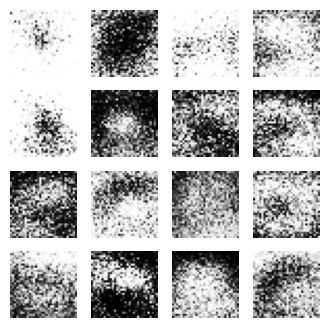

Starting epoch 2/50


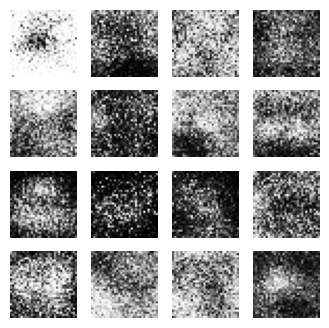

Starting epoch 3/50


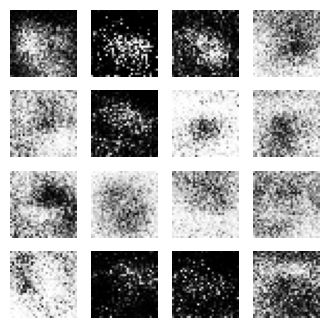

Starting epoch 4/50
Starting epoch 5/50


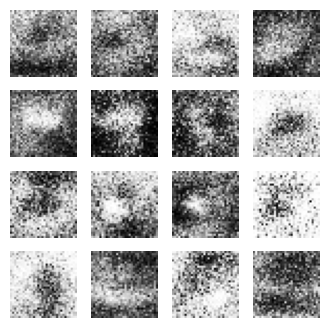

Starting epoch 6/50


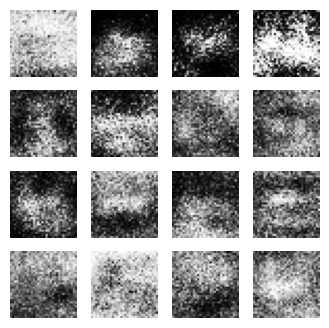

Starting epoch 7/50


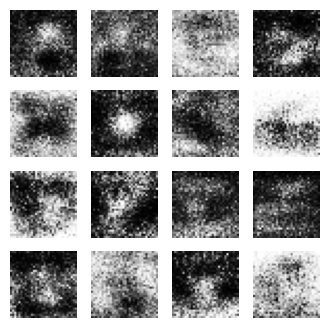

Starting epoch 8/50


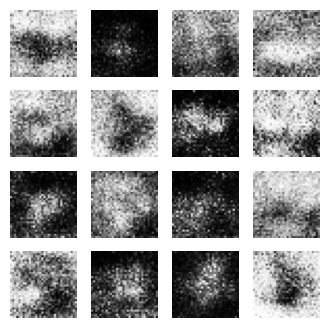

Starting epoch 9/50


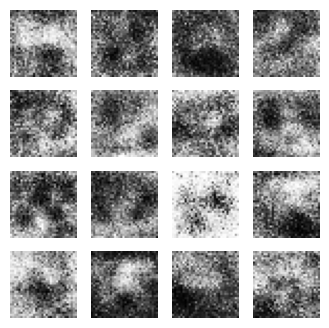

Starting epoch 10/50


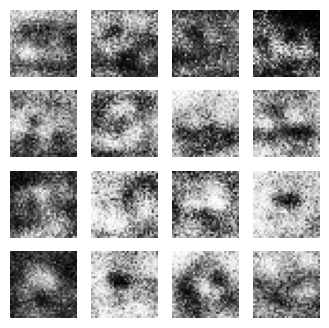

Starting epoch 11/50


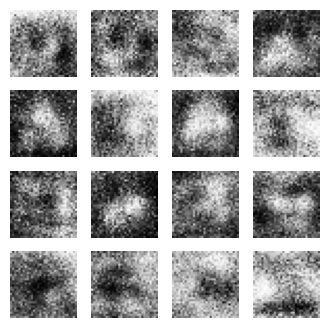

Starting epoch 12/50


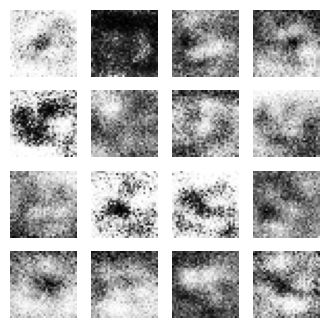

Starting epoch 13/50


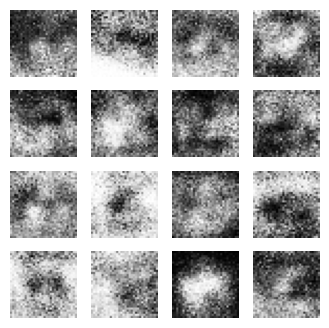

Starting epoch 14/50


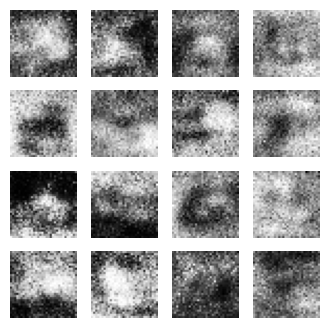

Starting epoch 15/50


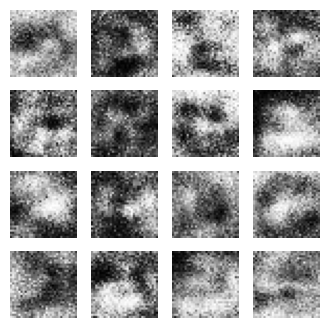

Starting epoch 16/50


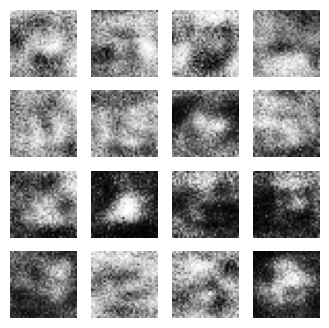

Starting epoch 17/50


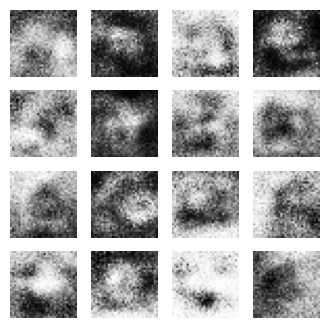

Starting epoch 18/50


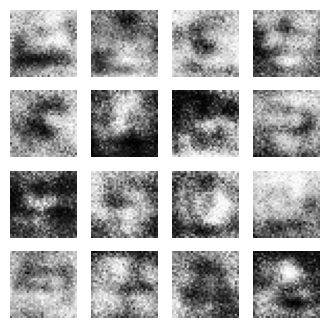

Starting epoch 19/50


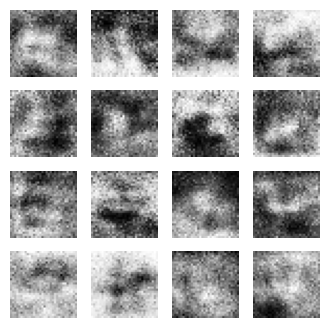

Starting epoch 20/50


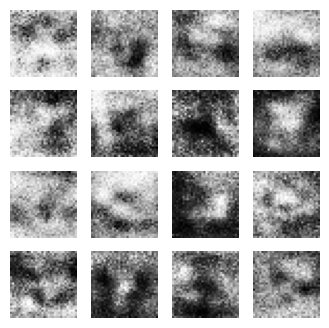

Starting epoch 21/50


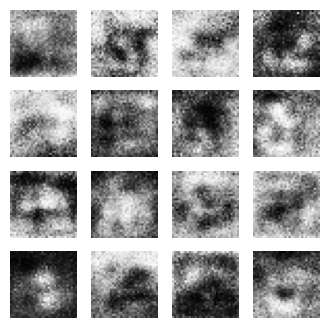

Starting epoch 22/50


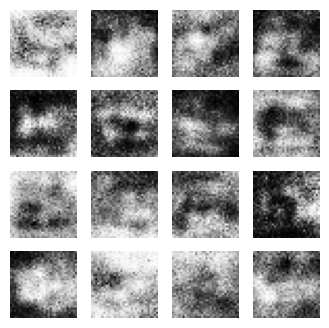

Starting epoch 23/50


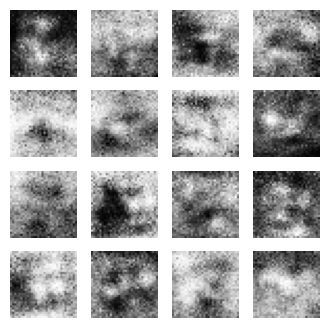

Starting epoch 24/50


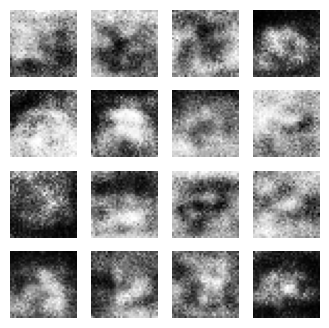

Starting epoch 25/50


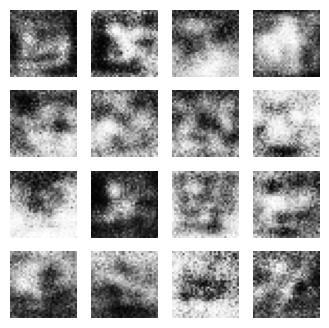

Starting epoch 26/50


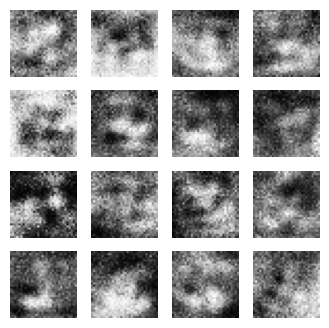

Starting epoch 27/50


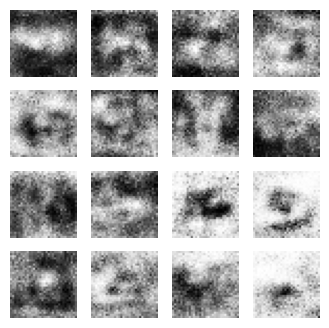

Starting epoch 28/50


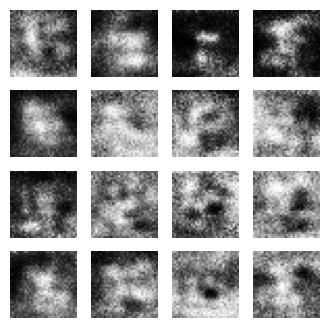

Starting epoch 29/50


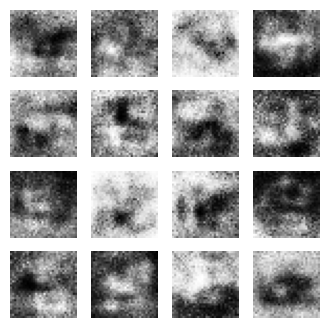

Starting epoch 30/50


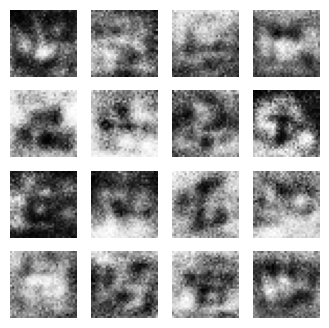

Starting epoch 31/50


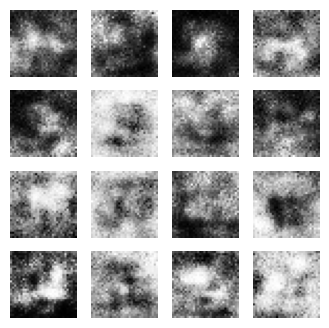

Starting epoch 32/50


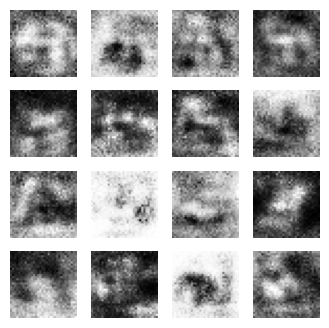

Starting epoch 33/50


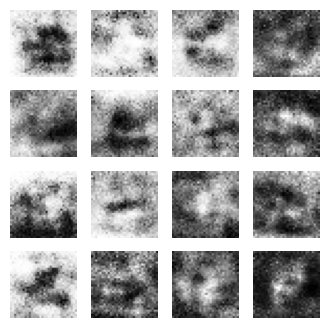

Starting epoch 34/50


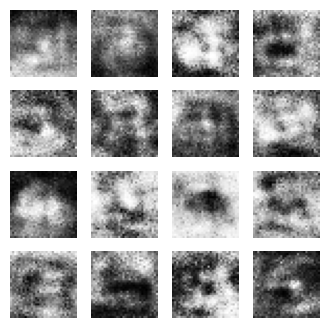

Starting epoch 35/50


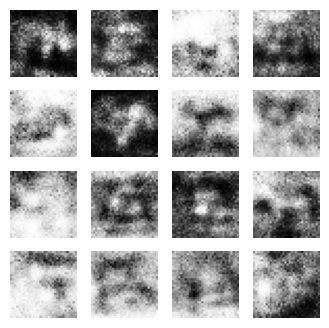

Starting epoch 36/50


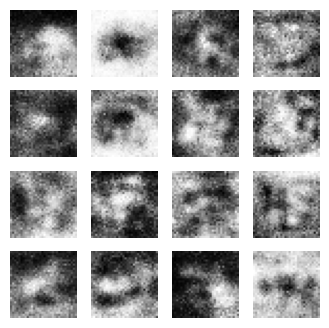

Starting epoch 37/50


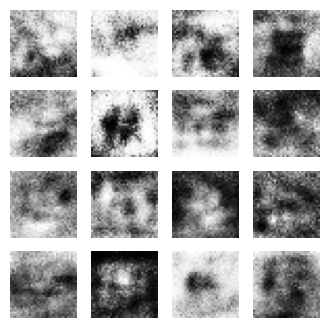

Starting epoch 38/50


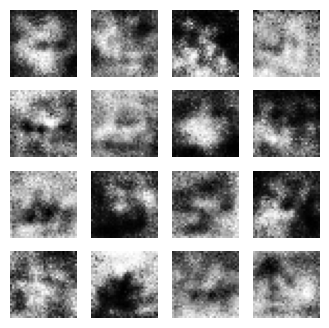

Starting epoch 39/50


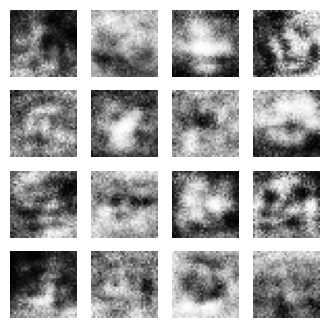

Starting epoch 40/50


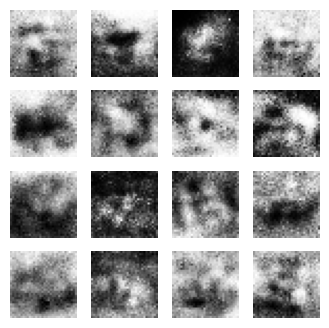

Starting epoch 41/50


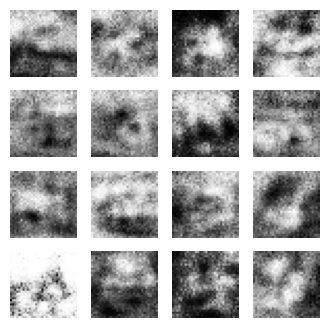

Starting epoch 42/50


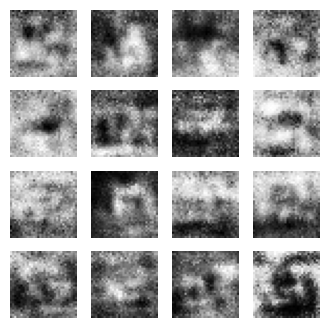

Starting epoch 43/50


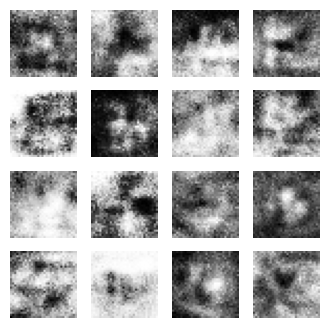

Starting epoch 44/50


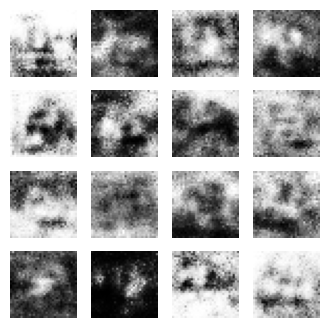

Starting epoch 45/50


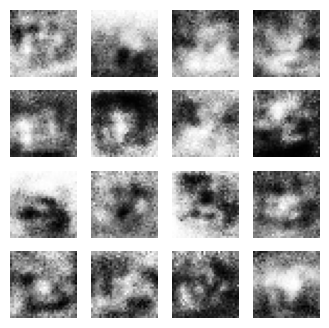

Starting epoch 46/50


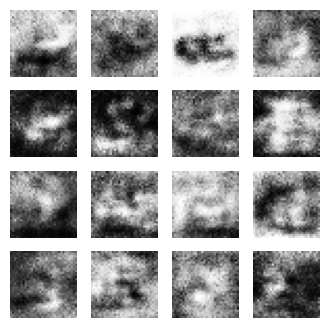

Starting epoch 47/50


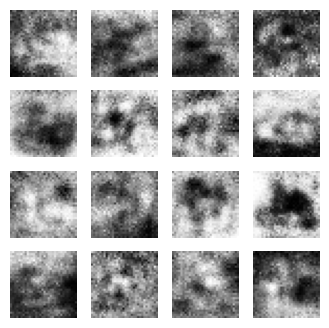

Starting epoch 48/50


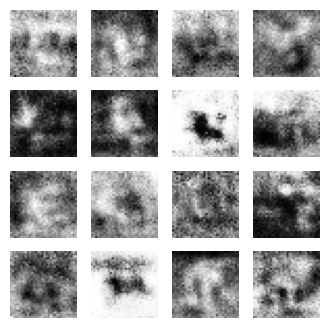

Starting epoch 49/50


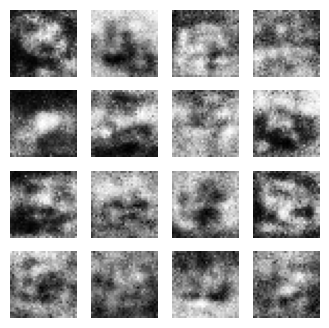

Starting epoch 50/50


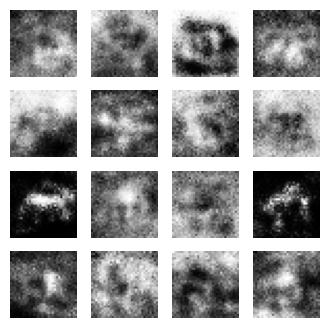

In [20]:
import tensorflow as tf
from tensorflow.keras.layers import LeakyReLU, BatchNormalization
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Flatten, Dense, Reshape, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential , Model
import matplotlib.pyplot as plt
import numpy as np

# Dataset and Image Dimensions
(x_train, _), (_, _) = cifar10.load_data()
x_train = x_train.astype('float32') / 255.0
x_train = (x_train - 0.5) * 2  # Normalize to [-1, 1]
img_dim = x_train.shape[1:]  # For CIFAR-10, this would be (32, 32, 3)
latent_dim = 100  # Latent space dimensionality
batch_size = 32

# Generator and Discriminator Architectures
def make_generator_model():
    model = Sequential()
    model.add(Dense(256, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Dense(512))
    model.add(LeakyReLU(0.2))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Dense(1024))
    model.add(LeakyReLU(0.2))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Dense(np.prod(img_dim), activation='tanh'))
    model.add(Reshape(img_dim))
    return model

def make_discriminator_model():
    model = Sequential()
    model.add(Flatten(input_shape=img_dim))
    model.add(Dense(1024))
    model.add(LeakyReLU(0.2))
    model.add(Dense(512))
    model.add(LeakyReLU(0.2))
    model.add(Dense(256))
    model.add(LeakyReLU(0.2))
    model.add(Dense(1, activation='sigmoid'))
    return model

# Create models
generator = make_generator_model()
discriminator = make_discriminator_model()

# Optimizers
generator_optimizer = Adam(1e-4)
discriminator_optimizer = Adam(1e-4)

# Loss functions
cross_entropy = BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

# Training Loop
@tf.function
def train_step(images):
    noise = tf.random.normal([batch_size, latent_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))


def generate_and_save_images(generator, epoch, seed=1):
    noise = tf.random.normal([16, latent_dim], seed=seed)  # Generate noise with the seed
    predictions = generator(noise, training=False)
    fig = plt.figure(figsize=(4, 4))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow(predictions[i, :, :, 0] * 0.5 + 0.5, cmap='gray')
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()
    plt.close()

# Training Loop
def train(dataset, epochs):
    for epoch in range(epochs):
        print(f'Starting epoch {epoch+1}/{epochs}')
        for image_batch in dataset:
            train_step(image_batch)
        generate_and_save_images(generator, epoch + 1)

# Assuming you've already defined `generate_images` to use the generator model
def generate_images(generator, noise):
     generated_images = generator(noise, training=False)
#     # Optionally, save these images

# Prepare dataset for training
train_dataset = tf.data.Dataset.from_tensor_slices(x_train).shuffle(x_train.shape[0]).batch(batch_size)

# Train the model
EPOCHS = 50
train(train_dataset, EPOCHS)



**FOR CUSTOM DATA**

In [4]:
!unzip /content/archive.zip

Archive:  /content/archive.zip
   creating: archive/class 1/
  inflating: archive/class 1/Afton-Smith.jpg  
  inflating: archive/class 1/alan-wagner.jpeg  
  inflating: archive/class 1/Alpacino.jpg  


Found 3 images belonging to 1 classes.
Starting epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/nn.py:681: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


Processed batch 1
Processed batch 2
Processed batch 3


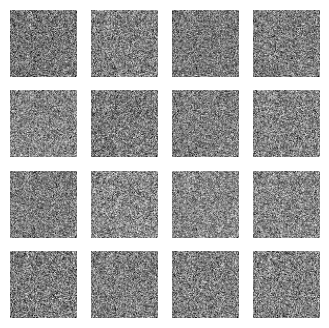

Epoch 1 completed

Starting epoch 2/50
Processed batch 1
Processed batch 2
Processed batch 3


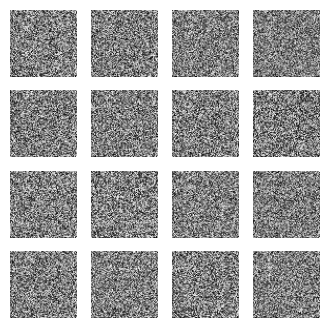

Epoch 2 completed

Starting epoch 3/50
Processed batch 1
Processed batch 2
Processed batch 3


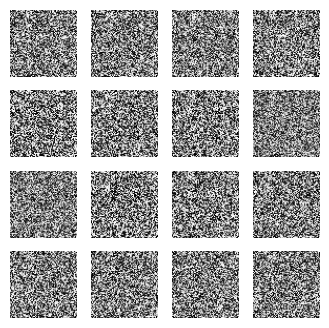

Epoch 3 completed

Starting epoch 4/50
Processed batch 1
Processed batch 2
Processed batch 3


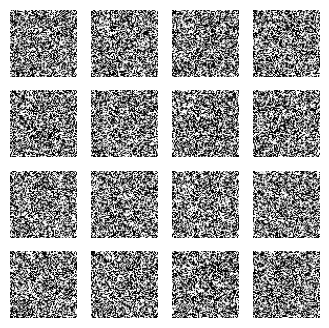

Epoch 4 completed

Starting epoch 5/50
Processed batch 1
Processed batch 2
Processed batch 3


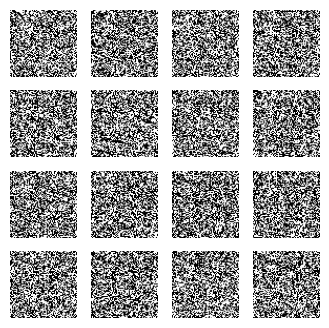

Epoch 5 completed

Starting epoch 6/50
Processed batch 1
Processed batch 2
Processed batch 3


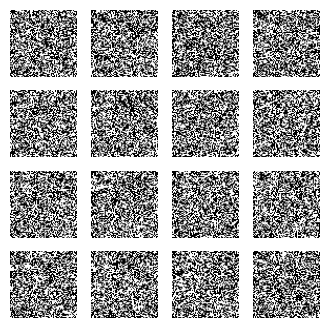

Epoch 6 completed

Starting epoch 7/50
Processed batch 1
Processed batch 2
Processed batch 3


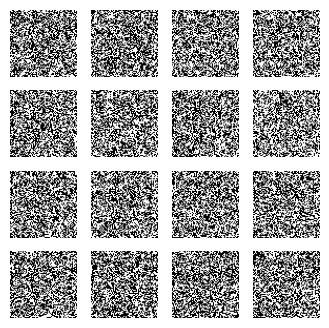

Epoch 7 completed

Starting epoch 8/50
Processed batch 1
Processed batch 2
Processed batch 3


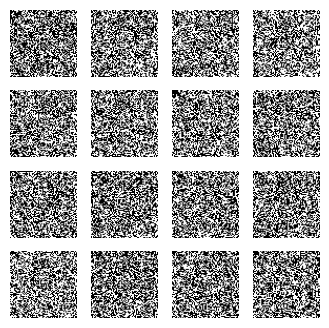

Epoch 8 completed

Starting epoch 9/50
Processed batch 1
Processed batch 2
Processed batch 3


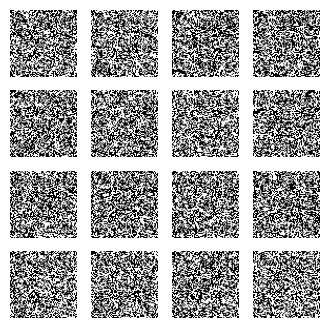

Epoch 9 completed

Starting epoch 10/50
Processed batch 1
Processed batch 2
Processed batch 3


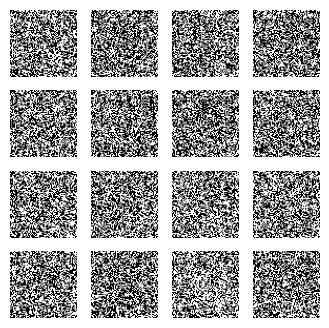

Epoch 10 completed

Starting epoch 11/50
Processed batch 1
Processed batch 2
Processed batch 3


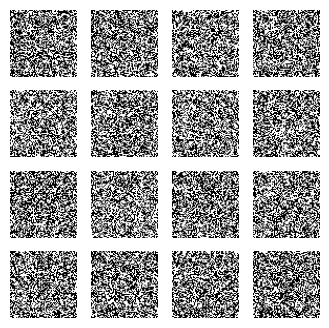

Epoch 11 completed

Starting epoch 12/50
Processed batch 1
Processed batch 2
Processed batch 3


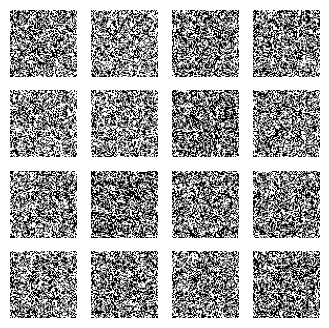

Epoch 12 completed

Starting epoch 13/50
Processed batch 1
Processed batch 2
Processed batch 3


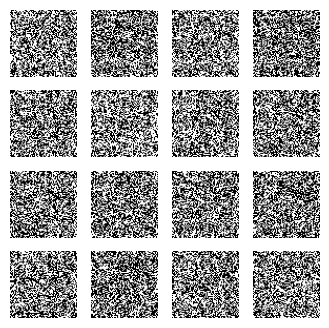

Epoch 13 completed

Starting epoch 14/50
Processed batch 1
Processed batch 2
Processed batch 3


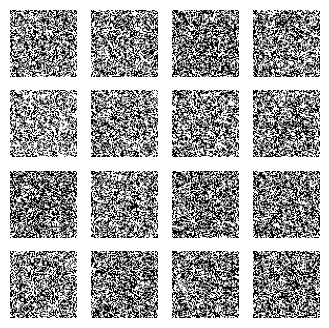

Epoch 14 completed

Starting epoch 15/50
Processed batch 1
Processed batch 2
Processed batch 3


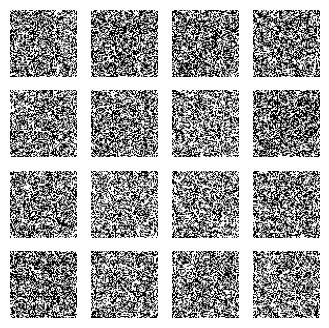

Epoch 15 completed

Starting epoch 16/50
Processed batch 1
Processed batch 2
Processed batch 3


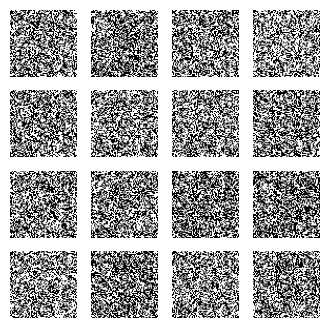

Epoch 16 completed

Starting epoch 17/50
Processed batch 1
Processed batch 2
Processed batch 3


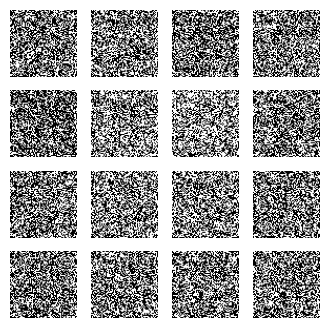

Epoch 17 completed

Starting epoch 18/50
Processed batch 1
Processed batch 2
Processed batch 3


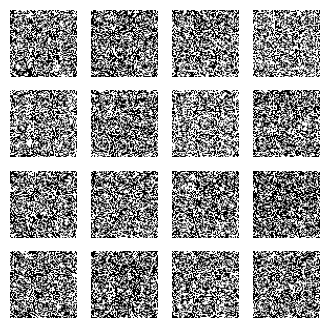

Epoch 18 completed

Starting epoch 19/50
Processed batch 1
Processed batch 2
Processed batch 3


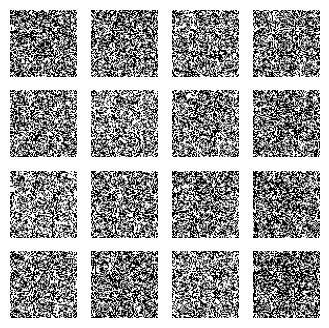

Epoch 19 completed

Starting epoch 20/50
Processed batch 1
Processed batch 2
Processed batch 3


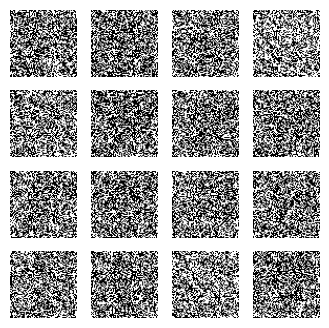

Epoch 20 completed

Starting epoch 21/50
Processed batch 1
Processed batch 2
Processed batch 3


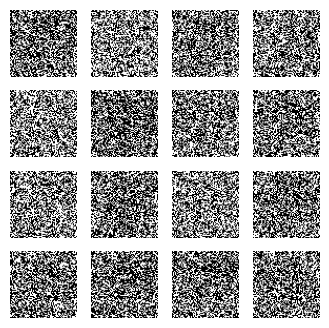

Epoch 21 completed

Starting epoch 22/50
Processed batch 1
Processed batch 2
Processed batch 3


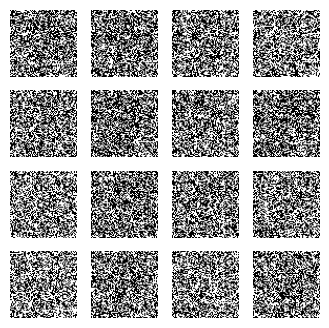

Epoch 22 completed

Starting epoch 23/50
Processed batch 1
Processed batch 2
Processed batch 3


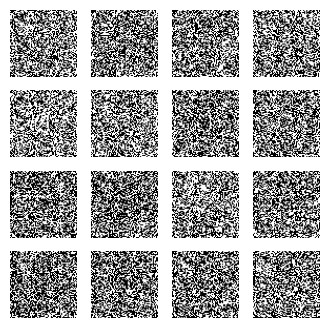

Epoch 23 completed

Starting epoch 24/50
Processed batch 1
Processed batch 2
Processed batch 3


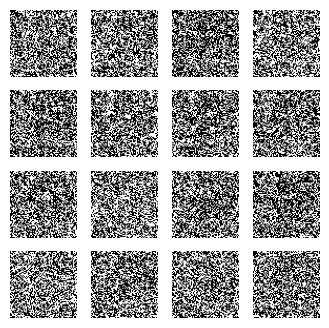

Epoch 24 completed

Starting epoch 25/50
Processed batch 1
Processed batch 2
Processed batch 3


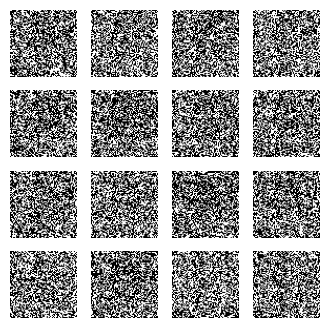

Epoch 25 completed

Starting epoch 26/50
Processed batch 1
Processed batch 2
Processed batch 3


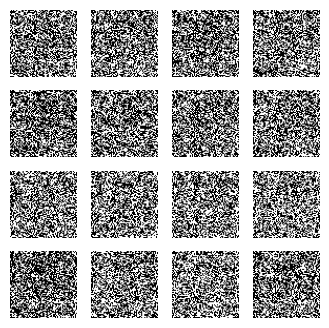

Epoch 26 completed

Starting epoch 27/50
Processed batch 1
Processed batch 2
Processed batch 3


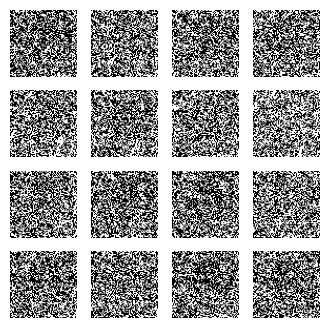

Epoch 27 completed

Starting epoch 28/50
Processed batch 1
Processed batch 2
Processed batch 3


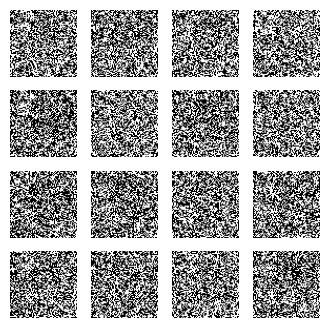

Epoch 28 completed

Starting epoch 29/50
Processed batch 1
Processed batch 2
Processed batch 3


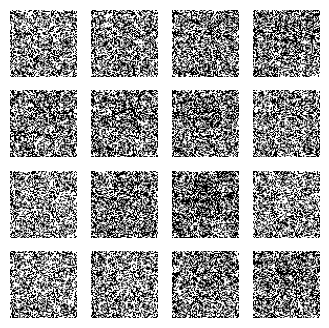

Epoch 29 completed

Starting epoch 30/50
Processed batch 1
Processed batch 2
Processed batch 3


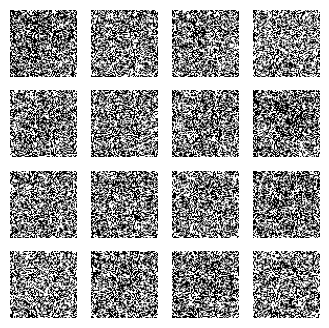

Epoch 30 completed

Starting epoch 31/50
Processed batch 1
Processed batch 2
Processed batch 3


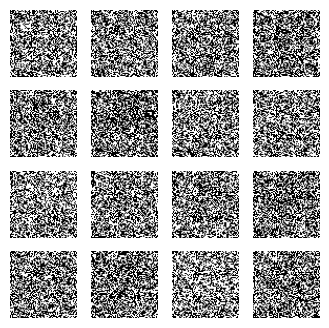

Epoch 31 completed

Starting epoch 32/50
Processed batch 1
Processed batch 2
Processed batch 3


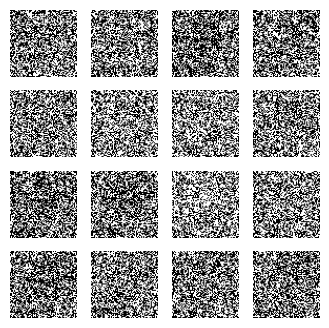

Epoch 32 completed

Starting epoch 33/50
Processed batch 1
Processed batch 2
Processed batch 3


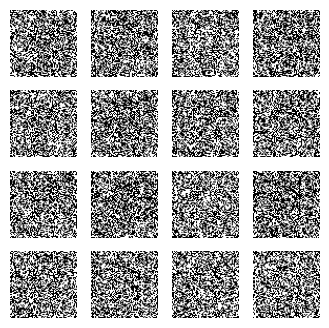

Epoch 33 completed

Starting epoch 34/50
Processed batch 1
Processed batch 2
Processed batch 3


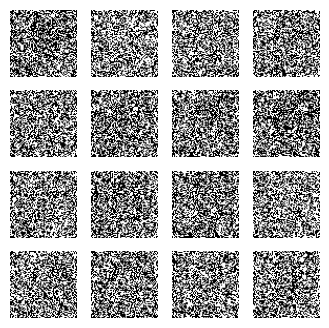

Epoch 34 completed

Starting epoch 35/50
Processed batch 1
Processed batch 2
Processed batch 3


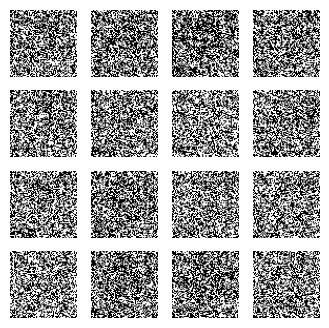

Epoch 35 completed

Starting epoch 36/50
Processed batch 1
Processed batch 2
Processed batch 3


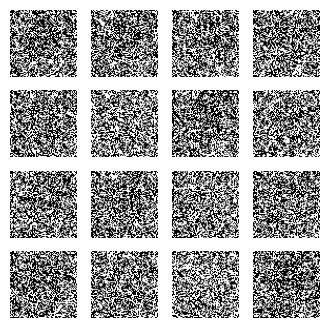

Epoch 36 completed

Starting epoch 37/50
Processed batch 1
Processed batch 2
Processed batch 3


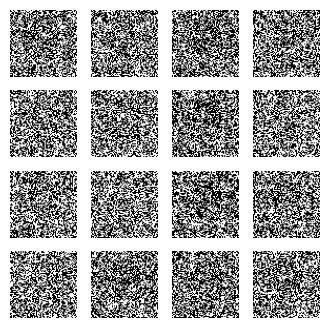

Epoch 37 completed

Starting epoch 38/50
Processed batch 1
Processed batch 2
Processed batch 3


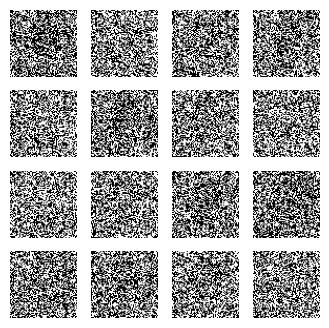

Epoch 38 completed

Starting epoch 39/50
Processed batch 1
Processed batch 2
Processed batch 3


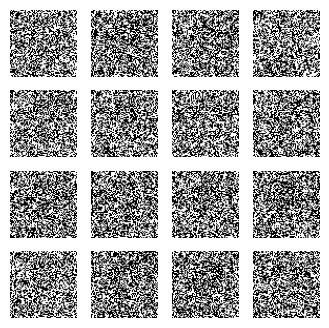

Epoch 39 completed

Starting epoch 40/50
Processed batch 1
Processed batch 2
Processed batch 3


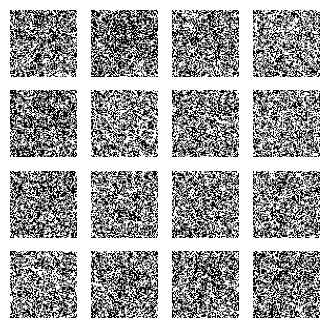

Epoch 40 completed

Starting epoch 41/50
Processed batch 1
Processed batch 2
Processed batch 3


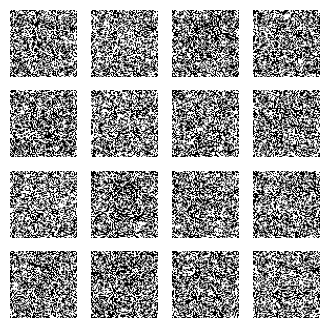

Epoch 41 completed

Starting epoch 42/50
Processed batch 1
Processed batch 2
Processed batch 3


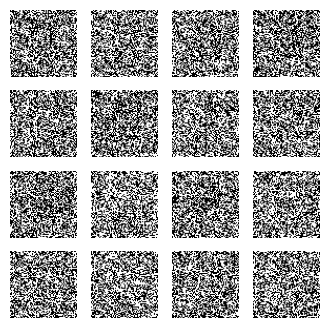

Epoch 42 completed

Starting epoch 43/50
Processed batch 1
Processed batch 2
Processed batch 3


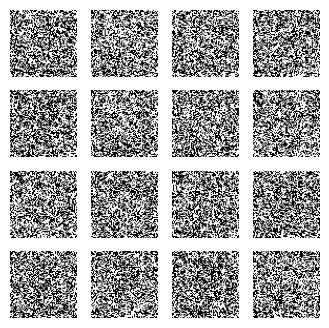

Epoch 43 completed

Starting epoch 44/50
Processed batch 1
Processed batch 2
Processed batch 3


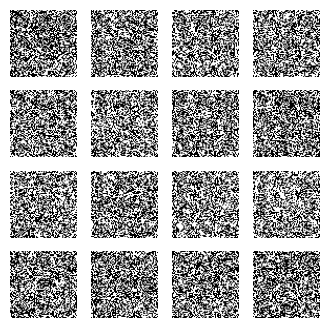

Epoch 44 completed

Starting epoch 45/50
Processed batch 1
Processed batch 2
Processed batch 3


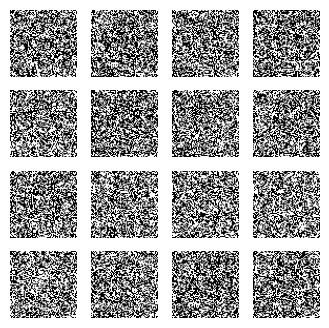

Epoch 45 completed

Starting epoch 46/50
Processed batch 1
Processed batch 2
Processed batch 3


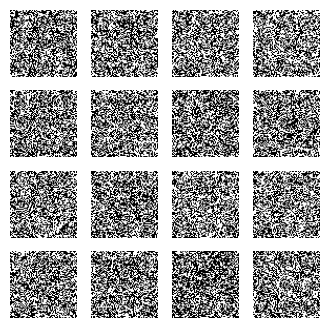

Epoch 46 completed

Starting epoch 47/50
Processed batch 1
Processed batch 2
Processed batch 3


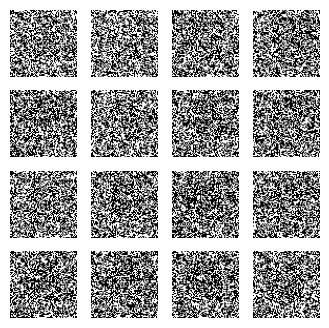

Epoch 47 completed

Starting epoch 48/50
Processed batch 1
Processed batch 2
Processed batch 3


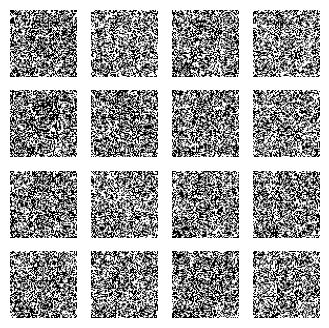

Epoch 48 completed

Starting epoch 49/50
Processed batch 1
Processed batch 2
Processed batch 3


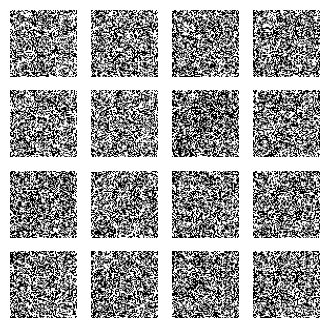

Epoch 49 completed

Starting epoch 50/50
Processed batch 1
Processed batch 2
Processed batch 3


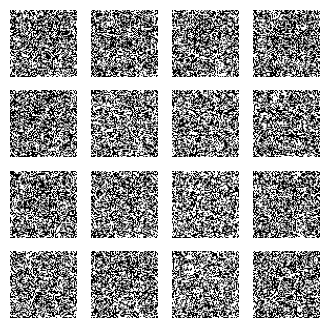

Epoch 50 completed



In [7]:
import tensorflow as tf
from tensorflow.keras.layers import LeakyReLU, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Flatten, Dense, Reshape, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential , Model
import matplotlib.pyplot as plt
import numpy as np

dataset_path="/content/archive"
#prepare dataset for loading
datagen = ImageDataGenerator(rescale=1.0/255.0)
img_height = 64
img_width = 64
latent_dim=100
img_channels=3
img_dim = (img_height, img_width, img_channels)
batch_size=1
train_dataset_generator = datagen.flow_from_directory(
    dataset_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode=None  # Since this is an unsupervised task, we don't need labels
)

# Generator and Discriminator Architectures
def make_generator_model():
    model = Sequential()
    model.add(Dense(256, input_dim=latent_dim))
    model.add(LeakyReLU(0.2))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Dense(512))
    model.add(LeakyReLU(0.2))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Dense(1024))
    model.add(LeakyReLU(0.2))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Dense(np.prod(img_dim), activation='tanh'))
    model.add(Reshape(img_dim))
    return model

def make_discriminator_model():
    model = Sequential()
    model.add(Flatten(input_shape=img_dim))
    model.add(Dense(1024))
    model.add(LeakyReLU(0.2))
    model.add(Dense(512))
    model.add(LeakyReLU(0.2))
    model.add(Dense(256))
    model.add(LeakyReLU(0.2))
    model.add(Dense(1, activation='sigmoid'))
    return model

# Create models
generator = make_generator_model()
discriminator = make_discriminator_model()

# Optimizers
generator_optimizer = Adam(1e-4)
discriminator_optimizer = Adam(1e-4)

# Loss functions
cross_entropy = BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

# Training Loop
@tf.function
def train_step(images):
    noise = tf.random.normal([batch_size, latent_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))


def generate_and_save_images(generator, epoch, seed=1):
    noise = tf.random.normal([16, latent_dim], seed=seed)  # Generate noise with the seed
    predictions = generator(noise, training=False)
    fig = plt.figure(figsize=(4, 4))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow(predictions[i, :, :, 0] * 0.5 + 0.5, cmap='gray')
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()
    plt.close()


# Assuming you've already defined `generate_images` to use the generator model
def generate_images(generator, noise):
     generated_images = generator(noise, training=False)
#     # Optionally, save these images


# Define number of steps per epoch
steps_per_epoch = len(train_dataset_generator)

# Training Loop

def train(dataset, epochs, steps_per_epoch):
    for epoch in range(epochs):
        print(f'Starting epoch {epoch+1}/{epochs}')
        batch_num = 0
        for step in range(steps_per_epoch):
            image_batch = next(iter(dataset))
            train_step(image_batch)
            batch_num += 1
            print(f'Processed batch {batch_num}')
        generate_and_save_images(generator, epoch + 1)
        print(f'Epoch {epoch+1} completed\n')


train_dataset = tf.data.Dataset.from_generator(
    lambda: train_dataset_generator,
    output_signature=tf.TensorSpec(shape=(None, img_height, img_width, img_channels), dtype=tf.float32)
)

# Train the model
EPOCHS = 50
train(train_dataset, EPOCHS, steps_per_epoch)

